In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline


# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2) #image pixel grid

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2.imshow('Img: '+fname,img)
        cv2.waitKey(100)

cv2.destroyAllWindows()



Text(0.5, 1.0, 'sample_undistorted_last')

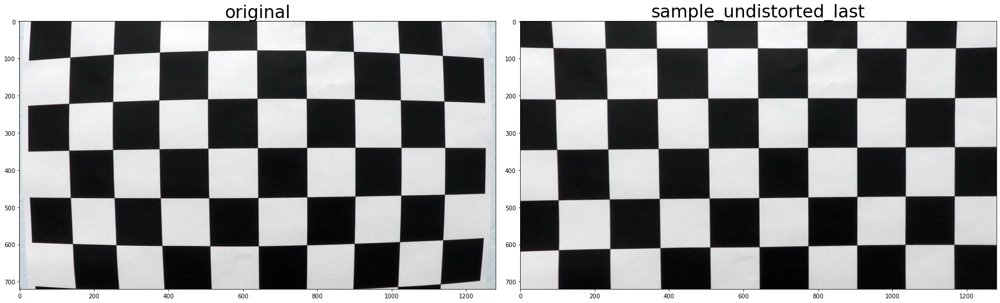

In [2]:
# (To-do1 (11/1): Apply a distortion correction to raw images, using calibrateCamera)
"""
- Compute the Camera calibration matrix and distortion coefficients given a set of chessboard images
- Apply a distortion correction to raw images
"""

def cal_undistort(img, objpoints, imgpoints):
    img_size = (img.shape[1], img.shape[0]) #x, y
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None,None)
    undist = cv2.undistort(img, mtx, dist, None, mtx )
    return undist

images= glob.glob('camera_cal/calibration*.jpg')
num=0
for image in images:
    num+=1
    sample_img = cv2.imread('camera_cal/calibration1.jpg')
    sample_undistorted =cal_undistort (sample_img, objpoints, imgpoints)
    #cv2.imwrite('output_images/undist/undistort'+str(num)+'.png',sample_undistorted)

f, (ax1, ax2) = plt.subplots(1,2, figsize=(24,9))
f.tight_layout()
ax1.imshow(sample_img)
ax1.set_title('original', fontsize=30)
ax2.imshow(sample_undistorted)
ax2.set_title('sample_undistorted_last', fontsize=30)


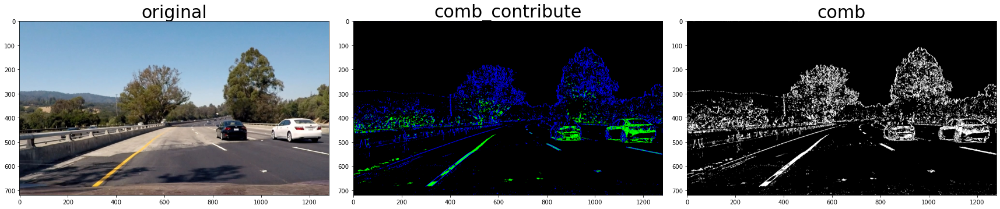

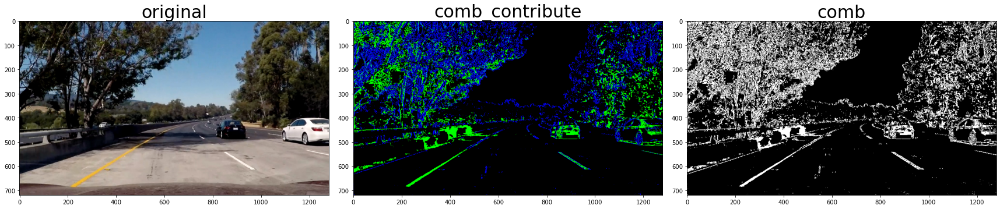

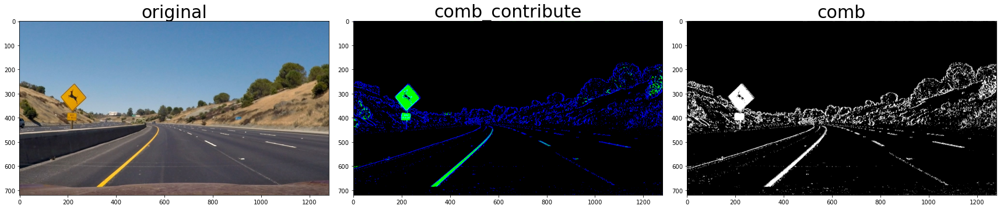

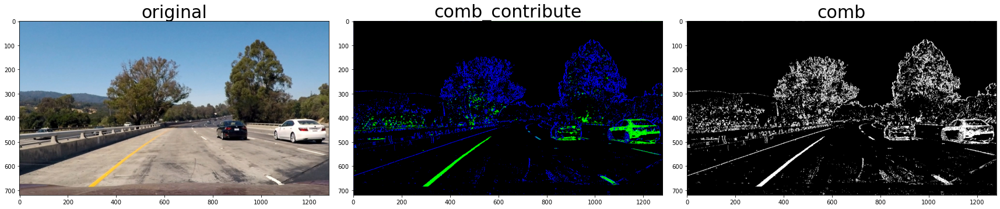

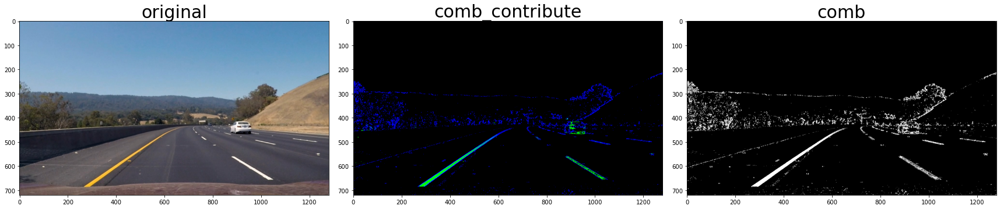

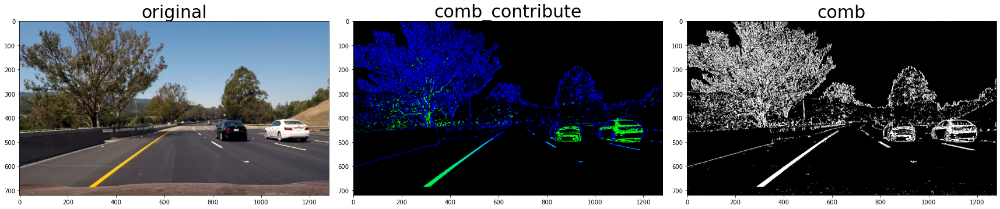

In [3]:
import matplotlib.image as mpimg


# (To-do2, 11/1: Use color transforms, gradients, etc., to create a threshold image)

def hls_color_thd(img,  threshold=(0,255), color_opt= ('hls') ):
    img_in = np.copy(img)

    if (color_opt == 'hls'):
        hls = cv2.cvtColor(img_in, cv2.COLOR_RGB2HLS)
        l_channel = hls[:,:,1]
        s_channel = hls[:,:,2]

        s_binary = np.zeros_like(s_channel)
        s_binary [ (s_channel >= threshold[0]) & ( s_channel <= threshold[1] )] =1

        return s_binary

    elif (color_opt == 'rgb'):
        rgb = img_in
        r_channel = rgb[:,:,0]
        g_channel = rgb[:,:,1]
        b_channel = rgb[:,:,2]

        r_binary = np.zeros_like(r_channel)
        r_binary [ (r_channel >= threshold[0]) & ( r_channel <= threshold[1] )] =1

        return r_binary

    else:
        print('set the color space')
        return np.zeros_like(img_in)
        


def gradient_thd(img,  sobel_kernel=3, threshold=(0,255), manner_opt=('mag')):
    img_in = np.copy(img)

    gray = cv2.cvtColor(img_in, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1,0, ksize=sobel_kernel) # x dir
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0,1, ksize=sobel_kernel) # y dir

    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)

    scaled_sobelx = np.uint8 ( 255 * abs_sobelx / np.max(abs_sobelx)) # normalized is needed to adapt threshold consistence
    scaled_sobely = np.uint8 ( 255 * abs_sobely / np.max(abs_sobely)) # normalized is needed to adapt threshold consistence

    sobel_xy = np.sqrt(sobelx**2 + sobely**2) # maginitude
    scaled_sobelxy = np.uint8( 255 * sobel_xy / np.max(sobel_xy)) # normalized is needed to adapt threshold consistence
    

    direction = np.arctan2(abs_sobely, abs_sobelx) # direction

    if manner_opt == 'mag' :
        binary_mag = np.zeros_like(scaled_sobelxy)
        binary_mag[ (scaled_sobelxy >= threshold[0]) & (scaled_sobelxy <= threshold[1]) ] = 1
        return binary_mag

    elif manner_opt == 'absx':
        binary_absx = np.zeros_like(scaled_sobelx)
        binary_absx[ (scaled_sobelx >= threshold[0]) & (scaled_sobelx <= threshold[1]) ] =1
        return binary_absx

    elif manner_opt == 'absy':
        binary_absy = np.zeros_like(scaled_sobely)
        binary_absy[ (scaled_sobely >= threshold[0]) & (scaled_sobely <= threshold[1]) ] =1

        return binary_absy

    elif manner_opt == 'dir':
        binary_dir = np.zeros_like(direction)
        binary_dir[ (direction >= threshold[0]) & (direction <= threshold[1]) ] = 1

        return binary_dir

    else:
        print('set the gradient manner')

images = glob.glob('test_images/test*.jpg')
num=0
for fname in images:
    num+=1
    sample_img = mpimg.imread(fname)
    sample_color_thd = hls_color_thd(sample_img, threshold=(180,255), color_opt='hls')

    sample_gradient_thd_x = gradient_thd(sample_img, sobel_kernel=3, threshold=(20,100), manner_opt='absx')
    sample_gradient_thd_y = gradient_thd(sample_img, sobel_kernel=3, threshold=(20,100), manner_opt='absy')
    sample_gradient_thd_mag = gradient_thd(sample_img, sobel_kernel=3, threshold=(20,100), manner_opt='mag')
    sample_gradient_thd_dir = gradient_thd(sample_img, sobel_kernel=3, threshold=(0/180*np.pi,60/180*np.pi), manner_opt='dir')

    #Combined , (11/1), HLS COLOR detection work most powerful than other sobel gradient method.
    comb_bin = np.zeros_like(sample_gradient_thd_mag)
    comb_bin[ ((sample_color_thd ==1)) | (( sample_gradient_thd_x==1) ) | ( (sample_gradient_thd_mag==1) & (sample_gradient_thd_dir==1) & ( sample_gradient_thd_y==1) ) ]=1
    comb_contribute = np.dstack((np.zeros_like(comb_bin), sample_color_thd, sample_gradient_thd_x))* 255
    
    #cv2.imwrite('output_images/binary/binary_comb'+str(num)+'.jpg',comb_bin*255)
    #cv2.imwrite('output_images/binary/dstack_binary_comb'+str(num)+'.jpg',comb_contribute)

    f, ( ax1, ax2,ax3) = plt.subplots(1,3, figsize=(24,9))
    f.tight_layout()

    ax1.imshow(sample_img)
    ax1.set_title('original', fontsize=30)

    ax2.imshow(comb_contribute)
    ax2.set_title('comb_contribute', fontsize=30)

    ax3.imshow(comb_bin, cmap='gray')
    ax3.set_title('comb', fontsize=30)

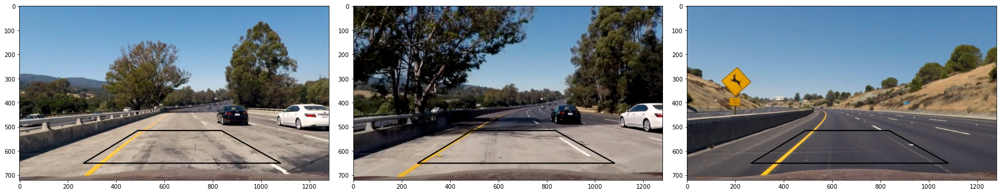

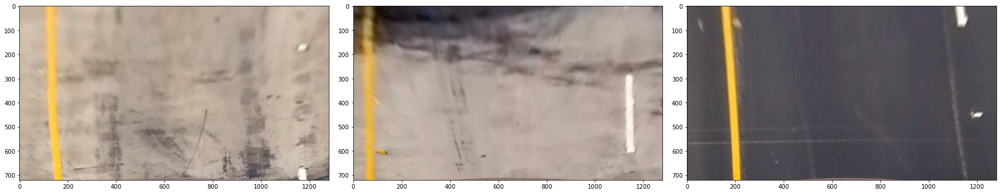

In [20]:
# To-do3: (11/1), Apply a perspective transform to rectify binary images ("bird-eye view")
# not yet, more tune is needed in points setting !

def perspective_img(undist_img,src_pts):
    #src to dst
    #set the four-pointt (warp rectangular, ROI)
    img_in = np.copy(undist_img)

    undistorted=undist_img

    offset = 50
    dst = np.float32 ( [[ offset, offset] ,[img.shape[1]-offset, offset] , [img.shape[1]-offset, img.shape[0]-offset] , [offset , img.shape[0]-offset] ])

    M = cv2.getPerspectiveTransform(src_pts, dst)
    warped = cv2.warpPerspective(undistorted, M, (img.shape[1], img.shape[0]))

    pts= np.array(src_pts, np.int32)
    pts= pts.reshape(-1,2)
    in_roi = np.copy(undistorted)
    roi=cv2.polylines(in_roi, [pts], True, (1,1,1),3) ########### comment out, for visualization (11/3)
    #roi = np.zeros_like(warped)
    #roi = undistorted

    return roi, warped, M



images = glob.glob('test_images/test*.jpg')
warped_set =[]
roi_set=[]
undist_set=[]
num=0
for fname in images:
    num+=1
    img = mpimg.imread(fname)
    src = np.float32( [ [490,515], [835,515],  [1080, 650], [265, 650] ] )
    undist_img = cal_undistort(img, objpoints, imgpoints)
    roi, warped, M =perspective_img(undist_img, src)

    warped_set.append(warped)
    roi_set.append(roi)
    undist_set.append(undist_img)
    #cv2.imwrite('output_images/warp/warp'+str(num)+'.jpg',warped)
    
f, ( ax1, ax2,ax3) = plt.subplots(1,3, figsize=(24,9))
f.tight_layout()
ax1.imshow(roi_set[3])
ax2.imshow(roi_set[1])
ax3.imshow(roi_set[2])
f, ( ax4, ax5,ax6) = plt.subplots(1,3, figsize=(24,9))
f.tight_layout()
ax4.imshow(warped_set[3])
ax5.imshow(warped_set[1])
ax6.imshow(warped_set[2])

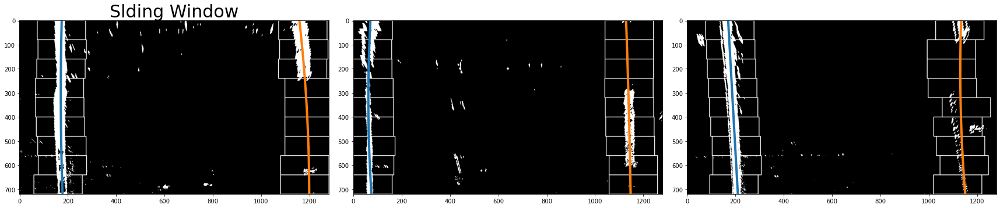

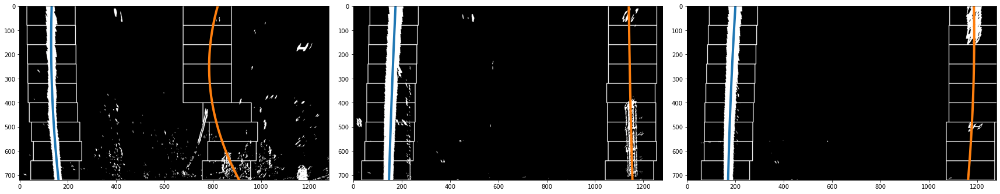

In [21]:
#To-do4: (11/2), Detect lane pixels and fit to find the lane boundary
### METHOD: Sliding Window

# FLOW
# distortion(camera cal) -->  thresholding(color, gradient) --> perspective --> histogram peak --> sliding window / search from prior --> curvature

def find_lane_pixels(binary_warped):
    bottom_half = binary_warped[binary_warped.shape[0]//2:,:]
    histogram = np.sum(bottom_half, axis=0)

    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    nwindows = 9
    margin = 100
    minpix=50

    window_height = np.int(binary_warped.shape[0] // nwindows)
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    for window in range(nwindows):
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - (window)*window_height

        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        cv2.rectangle(binary_warped, (win_xleft_low, win_y_low), (win_xleft_high, win_y_high) , (1,1,1), 2)
        cv2.rectangle(binary_warped, (win_xright_low, win_y_low), (win_xright_high, win_y_high), (1,1,1), 2)

        good_left_inds = ( (nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0] 
        good_right_inds= ( (nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

        """
        # Practice the syntax: 조건을 만족하는 픽셀만 담는다.
        a= np.array([0,1,2,3,4,5])
        b = np.array([0,0,1,1,1,1])

        good = (( a >2) & (b>0)).nonzero()[0]
        print(good)
        """

        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx= nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]

    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, binary_warped

def fit_polynomial(binary_warped):
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    ploty = np.linspace(0,binary_warped.shape[0]-1 , binary_warped.shape[0])
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    """ (11/8), line display
    for i in range(len(ploty)):
        if i < len(ploty)-1:
            sr_x = np.float32( left_fitx[i] )
            sr_y = np.float32( ploty[i] )
            
            dt_x = np.float32( left_fitx[i+1] )
            dt_y = np.float32( ploty[i+1] )
            
            cv2.line(out_img,  (sr_x, sr_y) , (dt_x, dt_y), 1 , 5)

            sr_x = np.float32( right_fitx[i] )
            sr_y = np.float32( ploty[i] )
            
            dt_x = np.float32( right_fitx[i+1] )
            dt_y = np.float32( ploty[i+1] )
            
            cv2.line(out_img,  (sr_x, sr_y) , (dt_x, dt_y), 1 , 5)
    """

    return out_img, left_fitx, right_fitx, ploty



images = glob.glob('test_images/test*.jpg')
results=[]
poly=[]

num=0

for fname in images:
    num+=1
    img = mpimg.imread(fname)
    # step 1: undistortion
    undist = cal_undistort(img, objpoints, imgpoints)

    # step 2: thresholding (color, gradient, combination)
    color_thd = hls_color_thd(undist, threshold=(180,255), color_opt='hls')
    gradient_thd_x = gradient_thd(undist, sobel_kernel=3, threshold=(20,100), manner_opt='absx')
    gradient_thd_y = gradient_thd(undist, sobel_kernel=3, threshold=(20,100), manner_opt='absy')
    gradient_thd_mag = gradient_thd(undist, sobel_kernel=3, threshold=(20,100), manner_opt='mag')
    gradient_thd_dir = gradient_thd(undist, sobel_kernel=3, threshold=(0/180*np.pi,60/180*np.pi), manner_opt='dir')
    comb_bin = np.zeros_like(gradient_thd_mag)
    comb_bin[ ((color_thd ==1)) | (( gradient_thd_x==1) ) | ( (gradient_thd_mag==1) & (gradient_thd_dir==1) & ( gradient_thd_y==1) ) ]=1

    # step 3: perspective
    src = np.float32( [ [490,515], [835,515],  [1080, 650], [265, 650] ] )
    roi, warped,M =perspective_img(comb_bin, src)

    # step 4: histogram: find_lane_pixels : polynomial
    # leftx, lefty, rightx, righty, fin_img=find_lane_pixels(binary_warped)
    # out_img, left_fitx, right_fitx, ploty=fit_polynomial(binary_warped)
    out_img, left_fitx, right_fitx, ploty=fit_polynomial(warped)
    poly.append([left_fitx, right_fitx, ploty])
    results.append(out_img)
    #cv2.imwrite('output_images/find_lane_pix/sliding_window/sliding_find_lane'+str(num)+'.jpg',out_img*255)
    
    

f, ( ax1, ax2,ax3) = plt.subplots(1,3, figsize=(24,9))
f.tight_layout()

ax1.imshow(results[0],cmap='gray')
ax1.set_title('Slding Window', fontsize=30)
ax1.plot(poly[0][0], poly[0][2], linewidth=4)
ax1.plot(poly[0][1], poly[0][2], linewidth=4)

ax2.imshow(results[1],cmap='gray')
ax2.plot(poly[1][0], poly[1][2], linewidth=4)
ax2.plot(poly[1][1], poly[1][2], linewidth=4)

ax3.imshow(results[2],cmap='gray')
ax3.plot(poly[2][0], poly[2][2], linewidth=4)
ax3.plot(poly[2][1], poly[2][2], linewidth=4)

f, ( ax1, ax2,ax3) = plt.subplots(1,3, figsize=(24,9))
f.tight_layout()

ax1.imshow(results[3],cmap='gray')
ax1.plot(poly[3][0], poly[3][2], linewidth=4)
ax1.plot(poly[3][1], poly[3][2], linewidth=4)

ax2.imshow(results[4],cmap='gray')
ax2.plot(poly[4][0], poly[4][2], linewidth=4)
ax2.plot(poly[4][1], poly[4][2], linewidth=4)

ax3.imshow(results[5],cmap='gray')
ax3.plot(poly[5][0], poly[5][2], linewidth=4)
ax3.plot(poly[5][1], poly[5][2], linewidth=4)



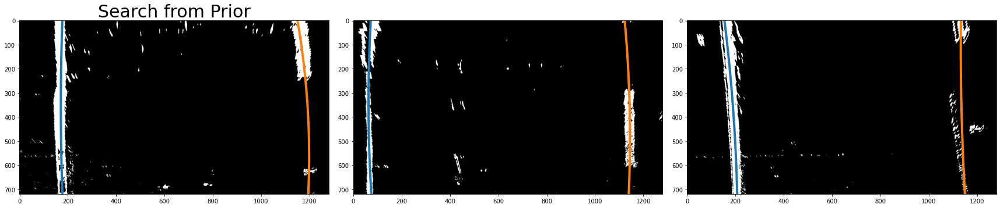

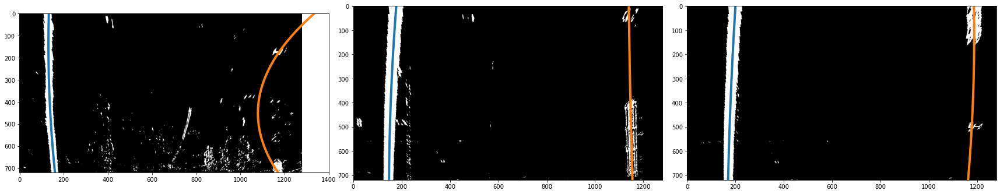

In [22]:
# (11/3)
### METHOD: Search from Prior

# FLOW
# distortion(camera cal) -->  thresholding(color, gradient) --> perspective --> histogram peak --> sliding window / search from prior --> curvature


images = glob.glob('test_images/test*.jpg')
results=[]
poly=[]

def fit_poly(img_shape, leftx, lefty, rightx, righty):
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    left_fitx = left_fit[0]* ploty**2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0]* ploty**2 + right_fit[1]* ploty + right_fit[2]

    return left_fitx, right_fitx, ploty


def search_around_poly(binary_warped ,init_tune):
    #HYPER PARAMETER
    margin = 150
    
    nonzero = binary_warped.nonzero()
    nonzerox = np.array(nonzero[1])
    nonzeroy = np.array(nonzero[0])

  
    left_lane_inds = (nonzerox > (init_tune[0][0] * (nonzeroy)**2 + init_tune[0][1] * nonzeroy + init_tune[0][2] - margin ) ) & \
                        ( nonzerox < (init_tune[0][0] * (nonzeroy)**2 + init_tune[0][1] * nonzeroy + init_tune[0][2] + margin ))
    right_lane_inds = (nonzerox > (init_tune[1][0] * (nonzeroy)**2 + init_tune[1][1] * nonzeroy + init_tune[1][2] - margin ) ) & \
                        ( nonzerox < (init_tune[1][0] * (nonzeroy)**2 + init_tune[1][1] * nonzeroy + init_tune[1][2] + margin ) )
   

    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]

    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fitx , right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
        
    #out_img = binary_warped 
    out_img = np.copy(binary_warped)


    """ (11/8), line display
    for i in range(len(ploty)):
        if i < len(ploty)-1:
            sr_x = np.float32( left_fitx[i] )
            sr_y = np.float32( ploty[i] )
            
            dt_x = np.float32( left_fitx[i+1] )
            dt_y = np.float32( ploty[i+1] )
            
            cv2.line(out_img,  (sr_x, sr_y) , (dt_x, dt_y), 1 , 5)

            sr_x = np.float32( right_fitx[i] )
            sr_y = np.float32( ploty[i] )
            
            dt_x = np.float32( right_fitx[i+1] )
            dt_y = np.float32( ploty[i+1] )
            
            cv2.line(out_img,  (sr_x, sr_y) , (dt_x, dt_y), 1 , 5)
    """
    
    
    
    return out_img, left_fitx, right_fitx, ploty

num = 0

for fname in images:
    num+=1
    img = mpimg.imread(fname)
    # step 1: undistortion
    undist = cal_undistort(img, objpoints, imgpoints)

    # step 2: thresholding (color, gradient, combination)
    color_thd = hls_color_thd(undist, threshold=(180,255), color_opt='hls')
    gradient_thd_x = gradient_thd(undist, sobel_kernel=3, threshold=(20,100), manner_opt='absx')
    gradient_thd_y = gradient_thd(undist, sobel_kernel=3, threshold=(20,100), manner_opt='absy')
    gradient_thd_mag = gradient_thd(undist, sobel_kernel=3, threshold=(20,100), manner_opt='mag')
    gradient_thd_dir = gradient_thd(undist, sobel_kernel=3, threshold=(0/180*np.pi,60/180*np.pi), manner_opt='dir')
    comb_bin = np.zeros_like(gradient_thd_mag)
    comb_bin[ ((color_thd ==1)) | (( gradient_thd_x==1) ) | ( (gradient_thd_mag==1) & (gradient_thd_dir==1) & ( gradient_thd_y==1) ) ]=1

    # step 3: perspective
    src = np.float32( [ [490,515], [835,515],  [1080, 650], [265, 650] ] )
    roi, warped,M =perspective_img(comb_bin, src)

    # step 4: Search from Prior
    left_fit = np.array([ 8.22279110e-05, -8.01574626e-02,  1.80496286e+02])
    right_fit = np.array([ 9.49537809e-05, -9.58782039e-02,  1.18196061e+03])

    
    init_tune = np.array( [left_fit, right_fit] )
    
    result, left_fitx, right_fitx, ploty = search_around_poly(warped, init_tune )



    results.append(result)
    poly.append([left_fitx, right_fitx, ploty])
    #cv2.imwrite('output_images/find_lane_pix/prior_search/prior_find_lane'+str(num)+'.jpg',result*255)

f, ( ax1, ax2,ax3) = plt.subplots(1,3, figsize=(24,9))
f.tight_layout()

ax1.imshow(results[0],cmap='gray')
ax1.set_title('Search from Prior', fontsize=30)
ax1.plot(poly[0][0], poly[0][2], linewidth=4)
ax1.plot(poly[0][1], poly[0][2], linewidth=4)

ax2.imshow(results[1],cmap='gray')
ax2.plot(poly[1][0], poly[1][2], linewidth=4)
ax2.plot(poly[1][1], poly[1][2], linewidth=4)

ax3.imshow(results[2],cmap='gray')
ax3.plot(poly[2][0], poly[2][2], linewidth=4)
ax3.plot(poly[2][1], poly[2][2], linewidth=4)

f, ( ax1, ax2,ax3) = plt.subplots(1,3, figsize=(24,9))
f.tight_layout()

ax1.imshow(results[3],cmap='gray')
ax1.plot(poly[3][0], poly[3][2], linewidth=4)
ax1.plot(poly[3][1], poly[3][2], linewidth=4)

ax2.imshow(results[4],cmap='gray')
ax2.plot(poly[4][0], poly[4][2], linewidth=4)
ax2.plot(poly[4][1], poly[4][2], linewidth=4)

ax3.imshow(results[5],cmap='gray')
ax3.plot(poly[5][0], poly[5][2], linewidth=4)
ax3.plot(poly[5][1], poly[5][2], linewidth=4)



In [23]:
#To-do5: (11/3), Determine the curvature of the lane and vehicle position with respect to center

#results.append(result)
#poly.append([left_fitx, right_fitx, ploty])

#To-do7: (11/4) Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position
#Update

# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/1000 # meters per pixel in x dimension
ratio = [xm_per_pix, ym_per_pix]
img_x_size = 1280 # image x size


def measure_curvature(left_fitx, right_fitx, ploty, ratio=(1, 1)):
    left_fit_cr = np.polyfit(ploty*ratio[1], left_fitx * ratio[0], 2)
    right_fit_cr = np.polyfit(ploty*ratio[1], right_fitx * ratio[0], 2)
    
    y_eval = np.max(ploty)

    # Calculation of R_curve (radius of curvature)
    left_curverad =  (  1 + (2*left_fit_cr[0] *y_eval*ym_per_pix + left_fit_cr[1]) **2)**1.5   / np.absolute(2*left_fit_cr[0] )
    right_curverad = (  1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5   / np.absolute(2*right_fit_cr[0] )
    
    mean_curverad = np.mean([left_curverad, right_curverad])
    

    left_x = left_fit_cr[0]*(y_eval*ym_per_pix)**2 + left_fit_cr[1]*(y_eval*ym_per_pix) + left_fit_cr[2]
    left_of_center  = (img_x_size/2)*xm_per_pix - left_x
    
    return left_curverad, right_curverad, mean_curverad , left_of_center


for idx in range(len(poly)):
    left_curverad, right_curverad, mean_curverad , left_of_center = measure_curvature(poly[idx][0], poly[idx][1], poly[idx][2], ratio)
    print('/Left curverad:',left_curverad,'m \t /Right curverad:' ,right_curverad,'m')
    print('/Radius of Curvature = ',mean_curverad,'(m) \t /Vehicle is ' ,left_of_center,'m left of center')
    


/Left curverad: 4756.96710159878 m 	 /Right curverad: 1536.3053770634092 m
/Radius of Curvature =  3146.6362393310947 (m) 	 /Vehicle is  1.7118368503544898 m left of center
/Left curverad: 2943.411054502133 m 	 /Right curverad: 2531.8245554108244 m
/Radius of Curvature =  2737.6178049564787 (m) 	 /Vehicle is  2.092857919562617 m left of center
/Left curverad: 3421.319690617791 m 	 /Right curverad: 4980.129947349699 m
/Radius of Curvature =  4200.724818983745 (m) 	 /Vehicle is  1.6010127344169771 m left of center
/Left curverad: 2648.8362306646486 m 	 /Right curverad: 188.37951010231689 m
/Radius of Curvature =  1418.6078703834828 (m) 	 /Vehicle is  1.7747818178261396 m left of center
/Left curverad: 4774.661100900891 m 	 /Right curverad: 19878.232035789802 m
/Radius of Curvature =  12326.446568345347 (m) 	 /Vehicle is  1.8214584604849833 m left of center
/Left curverad: 8773.006597333595 m 	 /Right curverad: 3309.1572193469315 m
/Radius of Curvature =  6041.081908340263 (m) 	 /Vehicle 

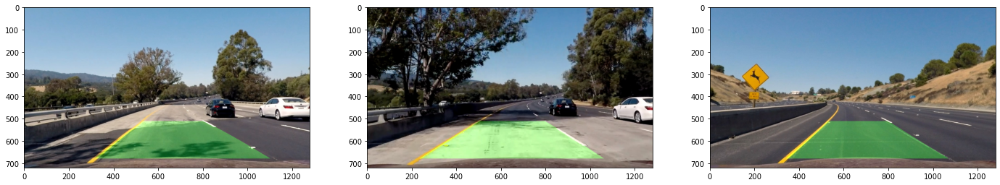

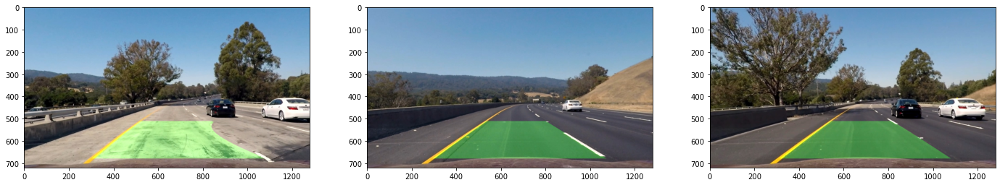

In [26]:
#To-do6: (11/3), Warp the detected lane boundaries back onto the original image

#results.append(result)
#poly.append([left_fitx, right_fitx, ploty])


newwarp_fin =[]
num = 0 
for i in range (len(results)):
    num += 1
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(results[i]).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack( [poly[i][0], poly[i][2]] ) )])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([poly[i][1], poly[i][2]])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    offset = 50
    dst = np.float32 ( [[ offset, offset] ,[results[0].shape[1]-offset, offset] , [results[0].shape[1]-offset, results[0].shape[0]-offset] , [offset , results[0].shape[0]-offset] ])
    src = np.float32( [ [490,515], [835,515],  [1080, 650], [265, 650] ] )

    Minv = cv2.getPerspectiveTransform(dst, src)
    newwarp = cv2.warpPerspective(color_warp, (Minv), (results[i].shape[1], results[i].shape[0])) 


    # Combine the result with the original image
    newwarp_fin_img = cv2.addWeighted(undist_set[i], 1, newwarp, 0.3, 0)
    #cv2.imwrite('output_images/inverse_warp/inversewarp'+str(num)+'.jpg',newwarp_fin_img)

    newwarp_fin.append(newwarp_fin_img)


f, ( ax1, ax2, ax3) = plt.subplots(1,3, figsize=(24,9))
ax1.imshow(newwarp_fin[0])
ax2.imshow(newwarp_fin[1])
ax3.imshow(newwarp_fin[2])

f, ( ax1, ax2, ax3) = plt.subplots(1,3, figsize=(24,9))
ax1.imshow(newwarp_fin[3])
ax2.imshow(newwarp_fin[4])
ax3.imshow(newwarp_fin[5])


In [33]:
#To-do8: (11/4) Video




def process_img(image):
    process_img.running_flag+=1
    
    img = np.copy(image)
    # FLOW
  
    # step 1: undistortion
    undist = cal_undistort(img, objpoints, imgpoints)

    # step 2: thresholding (color, gradient, combination)
    color_thd = hls_color_thd(undist, threshold=(180,255), color_opt='hls')
    gradient_thd_x = gradient_thd(undist, sobel_kernel=3, threshold=(20,100), manner_opt='absx')
    gradient_thd_y = gradient_thd(undist, sobel_kernel=3, threshold=(20,100), manner_opt='absy')
    gradient_thd_mag = gradient_thd(undist, sobel_kernel=3, threshold=(20,100), manner_opt='mag')
    gradient_thd_dir = gradient_thd(undist, sobel_kernel=3, threshold=(0/180*np.pi,60/180*np.pi), manner_opt='dir')
    comb_bin = np.zeros_like(gradient_thd_mag)
    comb_bin[ ((color_thd ==1)) | (( gradient_thd_x==1) ) | ( (gradient_thd_mag==1) & (gradient_thd_dir==1) & ( gradient_thd_y==1) ) ]=1

    # step 3: perspective
    src = np.float32( [ [490,515], [835,515],  [1080, 650], [265, 650] ] )
    roi, warped,M =perspective_img(comb_bin, src)

    # step 4: Search from Prior
    left_fit = np.array([ 8.22279110e-05, -8.01574626e-02,  1.80496286e+02])
    right_fit = np.array([ 9.49537809e-05, -9.58782039e-02,  1.18196061e+03])
    init_tune = np.array( [left_fit, right_fit] )

    result, left_fitx, right_fitx, ploty = search_around_poly(warped, init_tune )


    # step 5: curvature
     # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/1000 # meters per pixel in x dimension
    ratio = [xm_per_pix, ym_per_pix]

    left_curverad, right_curverad, mean_curverad , left_of_center = measure_curvature(left_fitx,right_fitx, ploty, ratio)
    str_curv_left= '/Left curverad[m]:'
    str_curv_left_rad= '%.2f' % (left_curverad)
    str_curv_right= '    Right curverad[m]:'
    str_curv_right_rad='%.2f' % (right_curverad) 

    str_curv = str_curv_left + str(str_curv_left_rad) +str_curv_right+str(str_curv_right_rad)

    # step 6: Inverse Warp
      # Create an image to draw the lines on
    warp_zero = np.zeros_like(result).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

      # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack( [left_fitx, ploty] ) )])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx,ploty])))])
    pts = np.hstack((pts_left, pts_right))

      # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

      # Warp the blank back to original image space using inverse perspective matrix (Minv)
    offset = 50
    dst = np.float32 ( [[ offset, offset] ,[results[0].shape[1]-offset, offset] , [results[0].shape[1]-offset, results[0].shape[0]-offset] , [offset , results[0].shape[0]-offset] ])
   
    Minv = cv2.getPerspectiveTransform(dst, src)
    newwarp = cv2.warpPerspective(color_warp, (Minv), (results[i].shape[1], results[i].shape[0])) 

      # Combine the result with the original image
    fin_img = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    cv2.putText(fin_img, str_curv, (10,200),  cv2.FONT_HERSHEY_SIMPLEX, fontScale=1, color=(0,0,255), thickness=2 )
   
    fin = fin_img

    return fin


from moviepy.editor import VideoFileClip
from IPython.display import HTML


process_img.running_flag = 0

src_string = 'project_video.mp4'
src_video= VideoFileClip(src_string).subclip(0,5)
out_video = 'test_'+src_string  


img_clip = src_video.fl_image(process_img)
%time img_clip.write_videofile(out_video, audio=False)




t:   0%|          | 0/125 [00:00<?, ?it/s, now=None]Moviepy - Building video test_project_video.mp4.
Moviepy - Writing video test_project_video.mp4

t:  23%|██▎       | 29/125 [00:22<01:00,  1.58it/s, now=None]

KeyboardInterrupt: 

In [10]:
#TEST DECORATE STATIC

def test_st(k):
    test_st.a+=k
    print(test_st.a)

    return test_st.a

test_st.a=1
for i in range(5):
    test_st.a=test_st(test_st.a)

2
4
8
16
32
